In [ ]:
!pip install cartopy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 59.6 MB/s eta 0:00:00


In [ ]:
import xarray as xr

In [ ]:
norm = {
  "2m_temperature": {
    "min": 188.02320861816406,
    "max": 326.905517578125
  },
  "total_precipitation": {
    "min": -3.725290298461914e-09,
    "max": 0.10059547424316406
  },
  "10m_u_component_of_wind": {
    "min": -281.12353515625,
    "max": 132.54061889648438
  },
  "10m_v_component_of_wind": {
    "min": -159.21847534179688,
    "max": 166.60025024414062
  },
  "surface_solar_radiation_downwards": {
    "min": -6.0,
    "max": 4890880.0
  },
  "evaporation": {
    "min": -0.0028332690708339214,
    "max": 0.0007333403918892145
  },
  "skin_temperature": {
    "min": 185.77236938476562,
    "max": 347.6108093261719
  },
  "snowfall": {
    "min": -4.656612873077393e-10,
    "max": 0.01572561264038086
  },
  "mean_sea_level_pressure": {
    "min": 89991.0625,
    "max": 109923.4375
  },
  "volumetric_soil_water_layer_1": {
    "min": -0.03136801719665527,
    "max": 0.790030837059021
  },
  "volumetric_soil_water_layer_2": {
    "min": -0.020388305187225342,
    "max": 0.78839111328125
  },
  "volumetric_soil_water_layer_3": {
    "min": -0.022721707820892334,
    "max": 0.7837305068969727
  },
  "volumetric_soil_water_layer_4": {
    "min": -2.9802322387695312e-08,
    "max": 0.7660064697265625
  },
  "soil_temperature_level_1": {
    "min": 196.46380615234375,
    "max": 340.4848327636719
  },
  "soil_temperature_level_2": {
    "min": 200.74496459960938,
    "max": 322.4053955078125
  },
  "soil_temperature_level_3": {
    "min": 197.9642333984375,
    "max": 317.30145263671875
  },
  "soil_temperature_level_4": {
    "min": 180.60952758789062,
    "max": 315.42120361328125
  }
}

In [ ]:
norm['soil_temperature_level_1']['min']

196.46380615234375

In [ ]:
ds = xr.open_dataset('pred_9.nc')

In [ ]:
ds

<xarray.Dataset> Size: 100MB
Dimensions:                          (latitude: 721, longitude: 1440)
Coordinates:
  * latitude                         (latitude) float32 3kB 90.0 89.75 ... -90.0
  * longitude                        (longitude) float32 6kB 0.0 0.25 ... 359.8
    dayofyear                        int64 8B ...
Data variables: (12/16)
    volumetric_soil_water_layer_1    (latitude, longitude) float32 4MB ...
    volumetric_soil_water_layer_2    (latitude, longitude) float32 4MB ...
    volumetric_soil_water_layer_3    (latitude, longitude) float32 4MB ...
    volumetric_soil_water_layer_4    (latitude, longitude) float32 4MB ...
    soil_temperature_level_1         (latitude, longitude) float32 4MB ...
    soil_temperature_level_2         (latitude, longitude) float32 4MB ...
    ...                               ...
    volumetric_soil_water_layer_3_9  (latitude, longitude) float64 8MB ...
    volumetric_soil_water_layer_4_9  (latitude, longitude) float64 8MB ...
    soil_temperature_level_1_9       (latitude, longitude) float64 8MB ...
    soil_temperature_level_2_9       (latitude, longitude) float64 8MB ...
    soil_temperature_level_3_9       (latitude, longitude) float64 8MB ...
    soil_temperature_level_4_9       (latitude, longitude) float64 8MB ...
Attributes:
    valid_time_start:       1940-01-01
    last_updated:           2025-08-20 01:58:26.771679+00:00
    valid_time_stop:        2025-04-30
    valid_time_stop_era5t:  2025-08-14

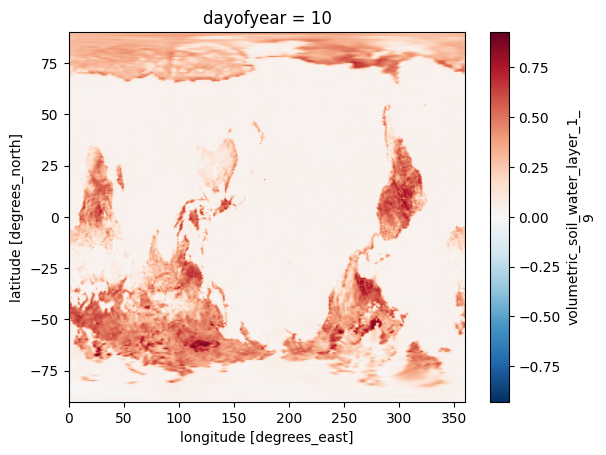

In [ ]:
ds.volumetric_soil_water_layer_1_9.plot()

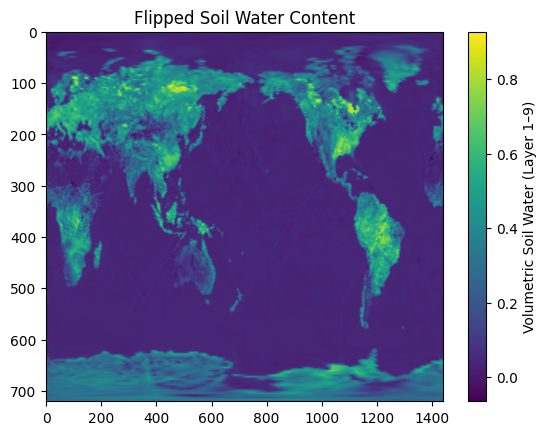

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Extract data as numpy array
data = ds.volumetric_soil_water_layer_1_9.values

# Flip upside down
flipped_data = np.flipud(data)

# Plot
plt.imshow(flipped_data, aspect='auto')
plt.colorbar(label="Volumetric Soil Water (Layer 1–9)")
plt.title("Flipped Soil Water Content")
plt.show()

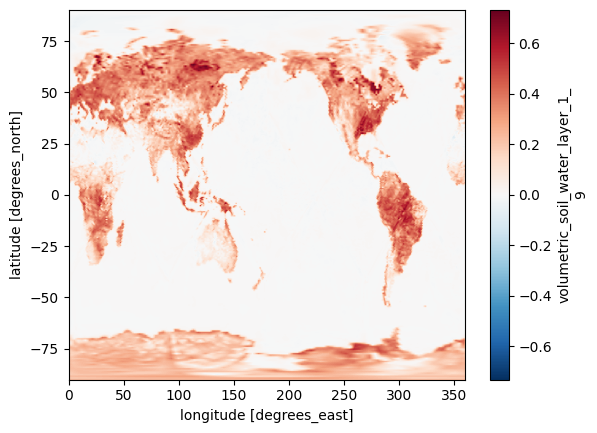

In [ ]:
import numpy as np
import xarray as xr

da = ds.volumetric_soil_water_layer_1_9 * (norm['volumetric_soil_water_layer_1']['max'] - norm['volumetric_soil_water_layer_1']['min']) + norm['volumetric_soil_water_layer_1']['min']

# Flip the data with numpy
flipped = np.flipud(da.values)

# Rebuild DataArray with same dims, coords, attrs
flipped_da = xr.DataArray(
    flipped,
    dims=da.dims,
    coords={dim: da.coords[dim] for dim in da.dims},
    attrs=da.attrs,
    name=da.name
)

# Plot with xarray
flipped_da.plot()

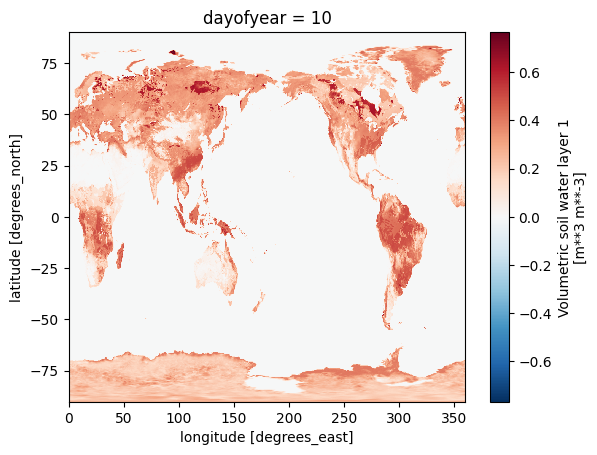

In [ ]:
ds.volumetric_soil_water_layer_1.plot()

/tmp/ipython-input-3541262461.py:106: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


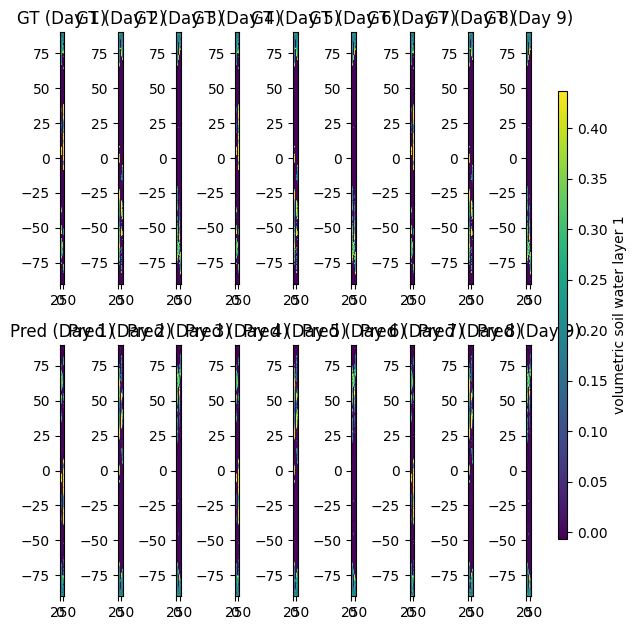

In [ ]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
from pathlib import Path

# ---------------- CONFIG ----------------
LEADS = range(1, 10)  # 1..9
FILE_TMPL = "pred_{lead}.nc"
BASE_VAR = "volumetric_soil_water_layer_1"  # ground-truth var name

# norm must already exist like:
# norm = {'volumetric_soil_water_layer_1': {'min': ..., 'max': ...}}

# --------------- HELPERS ----------------
def denorm_pred(da, var_key=BASE_VAR):
    vmin = norm[var_key]["min"]
    vmax = norm[var_key]["max"]
    return da * (vmax - vmin) + vmin

def flipud_numpy(da):
    """
    EXACTLY mimic: np.flipud(da.values) + rebuild DataArray with same dims/coords/attrs.
    NOTE: np.flipud flips axis 0 of the underlying ndarray. This assumes you've already
    selected any leading non-spatial dims (e.g., time/member) so axis 0 is your 'up/down'.
    """
    flipped = np.flipud(da.values)
    return xr.DataArray(
        flipped,
        dims=da.dims,
        coords={dim: da.coords[dim] for dim in da.dims},
        attrs=da.attrs,
        name=da.name
    )

# --------------- LOAD DATA --------------
gts = []
preds = []
available_leads = []

for lead in LEADS:
    p = Path(FILE_TMPL.format(lead=lead))
    if not p.exists():
        print(f"Warning: {p} not found, skipping lead {lead}")
        continue

    ds = xr.open_dataset(p)

    gt_da = ds[BASE_VAR]
    pred_name = f"{BASE_VAR}_{lead}"
    if pred_name not in ds:
        # fallback: pick any var that matches the prefix (last one if multiple)
        cand = [v for v in ds.data_vars if v.startswith(BASE_VAR + "_")]
        if not cand:
            raise KeyError(f"No prediction variable like {BASE_VAR}_{lead} in {p}")
        pred_name = cand[-1]
    pred_da = ds[pred_name]

    # if there is a time/ensemble dim, select one BEFORE flipud so axis 0 is spatial
    for dim in ["time", "step", "member"]:
        if dim in gt_da.dims:
            gt_da = gt_da.isel({dim: 0})
        if dim in pred_da.dims:
            pred_da = pred_da.isel({dim: 0})

    # denorm prediction, then flip both EXACTLY like your working snippet
    pred_da = denorm_pred(pred_da)
    gt_da_flipped   = flipud_numpy(gt_da)
    pred_da_flipped = flipud_numpy(pred_da)

    gts.append(gt_da_flipped)
    preds.append(pred_da_flipped)
    available_leads.append(lead)

if not available_leads:
    raise ValueError("No pred_<lead>.nc files were found.")

# ------------- COLOR SCALE --------------
stacked = xr.concat(gts + preds, dim="stack_for_range")
vmin = float(stacked.quantile(0.02).values)
vmax = float(stacked.quantile(0.98).values)

# --------------- PLOTTING ---------------
n = len(available_leads)
fig = plt.figure(figsize=(6, 6.4))

# Top row: Ground truth per lead
for j, (lead, gt_da) in enumerate(zip(available_leads, gts)):
    ax = plt.subplot(2, n, j + 1)
    im = gt_da.plot(ax=ax, vmin=vmin, vmax=vmax, add_colorbar=False)
    ax.set_title(f"GT (Day {lead})")
    ax.set_xlabel("")
    ax.set_ylabel("")

# Bottom row: Predictions per lead
for j, (lead, pred_da) in enumerate(zip(available_leads, preds)):
    ax = plt.subplot(2, n, n + j + 1)
    pred_da.plot(ax=ax, vmin=vmin, vmax=vmax, add_colorbar=False)
    ax.set_title(f"Pred (Day {lead})")
    ax.set_xlabel("")
    ax.set_ylabel("")

# One shared colorbar
cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
plt.colorbar(im, cax=cbar_ax, label=BASE_VAR.replace("_", " "))

plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.show()

/tmp/ipython-input-361367745.py:104: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


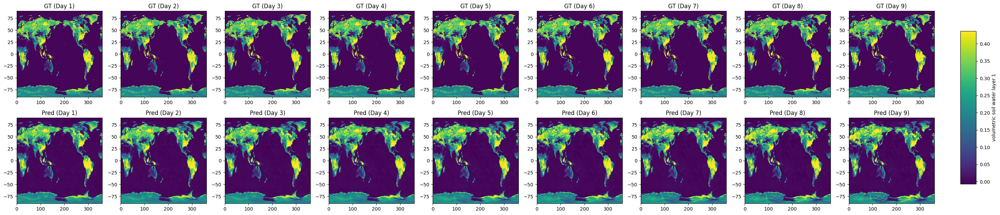

In [ ]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
from pathlib import Path

# ---------------- CONFIG ----------------
LEADS = range(1, 10)  # 1..9
FILE_TMPL = "pred_{lead}.nc"
BASE_VAR = "volumetric_soil_water_layer_1"  # ground-truth var name

# norm must already exist like:
# norm = {'volumetric_soil_water_layer_1': {'min': ..., 'max': ...}}

# --------------- HELPERS ----------------
def denorm_pred(da, var_key=BASE_VAR):
    vmin = norm[var_key]["min"]
    vmax = norm[var_key]["max"]
    return da * (vmax - vmin) + vmin

def flipud_numpy(da):
    """
    EXACT np.flipud on the raw values, then rebuild the DataArray.
    Make sure any leading non-spatial dims (time/member) are selected before calling.
    """
    flipped = np.flipud(da.values)
    return xr.DataArray(
        flipped,
        dims=da.dims,
        coords={dim: da.coords[dim] for dim in da.dims},
        attrs=da.attrs,
        name=da.name
    )

# --------------- LOAD DATA --------------
gts = []
preds = []
available_leads = []

for lead in LEADS:
    p = Path(FILE_TMPL.format(lead=lead))
    if not p.exists():
        print(f"Warning: {p} not found, skipping lead {lead}")
        continue

    ds = xr.open_dataset(p)

    # ground truth and prediction in this file
    gt_da = ds[BASE_VAR]
    pred_name = f"{BASE_VAR}_{lead}"
    if pred_name not in ds:
        cand = [v for v in ds.data_vars if v.startswith(BASE_VAR + "_")]
        if not cand:
            raise KeyError(f"No prediction variable like {BASE_VAR}_{lead} in {p}")
        pred_name = cand[-1]
    pred_da = ds[pred_name]

    # select a single slice if time/member present (do this before flipud)
    for dim in ["time", "step", "member"]:
        if dim in gt_da.dims:
            gt_da = gt_da.isel({dim: 0})
        if dim in pred_da.dims:
            pred_da = pred_da.isel({dim: 0})

    # denorm prediction; DO NOT flip ground truth; ONLY flip prediction
    pred_da = denorm_pred(pred_da)
    pred_da_flipped = flipud_numpy(pred_da)   # flip predictions only

    gts.append(gt_da)                 # unflipped GT
    preds.append(pred_da_flipped)     # flipped Pred
    available_leads.append(lead)

if not available_leads:
    raise ValueError("No pred_<lead>.nc files were found.")

# ------------- COLOR SCALE (robust, no concat) --------------
vals = np.concatenate([np.ravel(da.values) for da in (gts + preds)])
vmin = float(np.nanquantile(vals, 0.02))
vmax = float(np.nanquantile(vals, 0.98))

# --------------- PLOTTING ---------------
n = len(available_leads)
fig = plt.figure(figsize=(3.4 * n, 6.4))

# Top row: Ground truth per lead (unflipped)
for j, (lead, gt_da) in enumerate(zip(available_leads, gts)):
    ax = plt.subplot(2, n, j + 1)
    im = gt_da.plot(ax=ax, vmin=vmin, vmax=vmax, add_colorbar=False)
    ax.set_title(f"GT (Day {lead})")
    ax.set_xlabel("")
    ax.set_ylabel("")

# Bottom row: Predictions per lead (flipped)
for j, (lead, pred_da) in enumerate(zip(available_leads, preds)):
    ax = plt.subplot(2, n, n + j + 1)
    pred_da.plot(ax=ax, vmin=vmin, vmax=vmax, add_colorbar=False)
    ax.set_title(f"Pred (Day {lead})")
    ax.set_xlabel("")
    ax.set_ylabel("")

# One shared colorbar
cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
plt.colorbar(im, cax=cbar_ax, label=BASE_VAR.replace("_", " "))

plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.show()


/tmp/ipython-input-1530634760.py:122: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


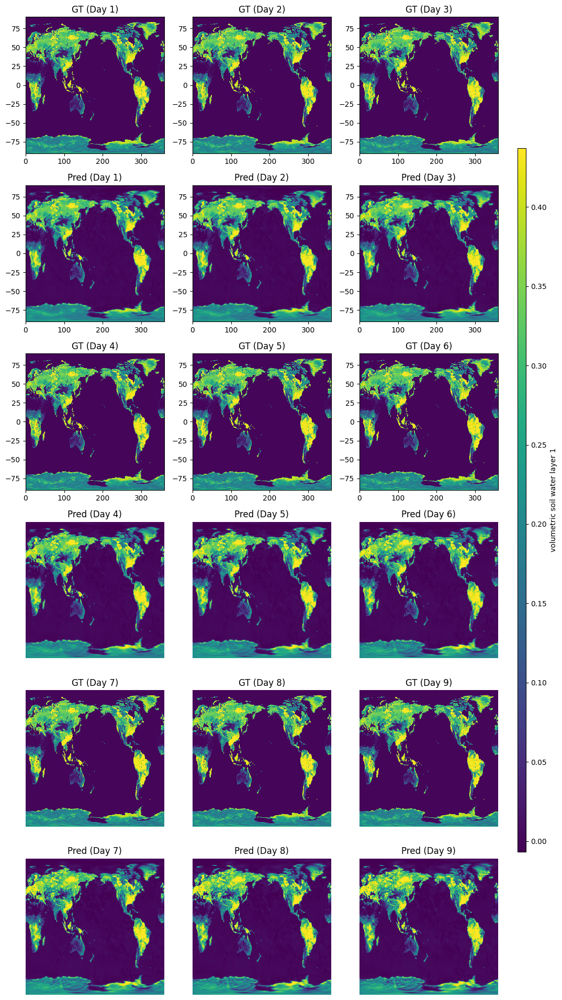

In [ ]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
from pathlib import Path
import math

# ---------------- CONFIG ----------------
LEADS = range(1, 10)  # 1..9
FILE_TMPL = "pred_{lead}.nc"
BASE_VAR = "volumetric_soil_water_layer_1"  # ground-truth var name
MAX_COLS = 3  # wrap at 3 columns

# norm must already exist like:
# norm = {'volumetric_soil_water_layer_1': {'min': ..., 'max': ...}}

# --------------- HELPERS ----------------
def denorm_pred(da, var_key=BASE_VAR):
    vmin = norm[var_key]["min"]
    vmax = norm[var_key]["max"]
    return da * (vmax - vmin) + vmin

def flipud_numpy(da):
    """np.flipud on raw values, then rebuild the DataArray."""
    flipped = np.flipud(da.values)
    return xr.DataArray(
        flipped,
        dims=da.dims,
        coords={dim: da.coords[dim] for dim in da.dims},
        attrs=da.attrs,
        name=da.name
    )

# --------------- LOAD DATA --------------
gts = []
preds = []
available_leads = []

for lead in LEADS:
    p = Path(FILE_TMPL.format(lead=lead))
    if not p.exists():
        print(f"Warning: {p} not found, skipping lead {lead}")
        continue

    ds = xr.open_dataset(p)

    # ground truth and prediction in this file
    gt_da = ds[BASE_VAR]
    pred_name = f"{BASE_VAR}_{lead}"
    if pred_name not in ds:
        cand = [v for v in ds.data_vars if v.startswith(BASE_VAR + "_")]
        if not cand:
            raise KeyError(f"No prediction variable like {BASE_VAR}_{lead} in {p}")
        pred_name = cand[-1]
    pred_da = ds[pred_name]

    # select a single slice if time/member present (do this before flipud)
    for dim in ["time", "step", "member"]:
        if dim in gt_da.dims:
            gt_da = gt_da.isel({dim: 0})
        if dim in pred_da.dims:
            pred_da = pred_da.isel({dim: 0})

    # denorm prediction; DO NOT flip ground truth; ONLY flip prediction
    pred_da = denorm_pred(pred_da)
    pred_da_flipped = flipud_numpy(pred_da)

    gts.append(gt_da)                 # unflipped GT
    preds.append(pred_da_flipped)     # flipped Pred
    available_leads.append(lead)

if not available_leads:
    raise ValueError("No pred_<lead>.nc files were found.")

# ------------- COLOR SCALE (robust, no concat) --------------
vals = np.concatenate([np.ravel(da.values) for da in (gts + preds)])
vmin = float(np.nanquantile(vals, 0.02))
vmax = float(np.nanquantile(vals, 0.98))

# --------------- PLOTTING WITH WRAP (max 3 cols) ---------------
n = len(available_leads)
cols = min(MAX_COLS, n)
blocks = math.ceil(n / cols)           # number of 2-row blocks
rows = 2 * blocks                      # GT row + Pred row per block

# size: ~3.6" per column width, ~3.2" per row height
fig_w = 3.6 * cols
fig_h = 3.2 * rows
fig, axes = plt.subplots(rows, cols, figsize=(fig_w, fig_h), squeeze=False)

im = None
for idx, (lead, gt_da, pred_da) in enumerate(zip(available_leads, gts, preds)):
    b = idx // cols                    # which block
    c = idx % cols                     # column within block
    r_gt = 2 * b                       # ground truth row index
    r_pr = 2 * b + 1                   # prediction row index

    # GT
    ax_gt = axes[r_gt, c]
    im = gt_da.plot(ax=ax_gt, vmin=vmin, vmax=vmax, add_colorbar=False)
    ax_gt.set_title(f"GT (Day {lead})")
    ax_gt.set_xlabel("")
    ax_gt.set_ylabel("")

    # Pred
    ax_pr = axes[r_pr, c]
    pred_da.plot(ax=ax_pr, vmin=vmin, vmax=vmax, add_colorbar=False)
    ax_pr.set_title(f"Pred (Day {lead})")
    ax_pr.set_xlabel("")
    ax_pr.set_ylabel("")

# Hide any unused axes (e.g., last row if leads % cols != 0)
total_slots = rows * cols
for unused in range(n, total_slots):
    b = unused // cols
    c = unused % cols
    axes[b, c].axis("off")

# Shared colorbar
cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
plt.colorbar(im, cax=cbar_ax, label=BASE_VAR.replace("_", " "))

plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.show()

/tmp/ipython-input-700556943.py:122: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


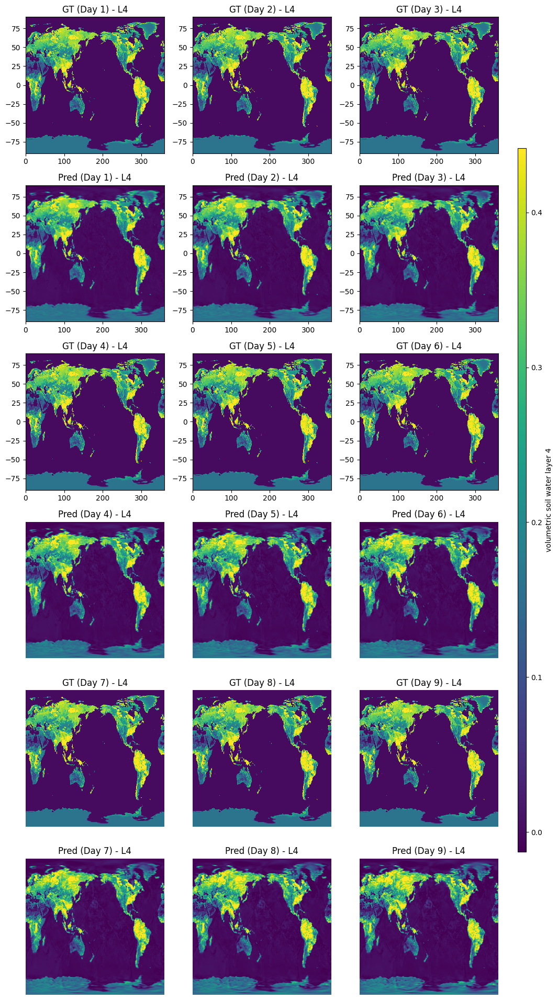

In [ ]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
from pathlib import Path
import math

# ---------------- CONFIG ----------------
LEADS = range(1, 10)  # 1..9
FILE_TMPL = "pred_{lead}.nc"
BASE_VAR = "volumetric_soil_water_layer_4"  # ground-truth var name (layer 4)
MAX_COLS = 3  # wrap at 3 columns

# norm must already exist like:
# norm = {'volumetric_soil_water_layer_4': {'min': ..., 'max': ...}}

# --------------- HELPERS ----------------
def denorm_pred(da, var_key=BASE_VAR):
    vmin = norm[var_key]["min"]
    vmax = norm[var_key]["max"]
    return da * (vmax - vmin) + vmin

def flipud_numpy(da):
    """np.flipud on raw values, then rebuild the DataArray."""
    flipped = np.flipud(da.values)
    return xr.DataArray(
        flipped,
        dims=da.dims,
        coords={dim: da.coords[dim] for dim in da.dims},
        attrs=da.attrs,
        name=da.name
    )

# --------------- LOAD DATA --------------
gts = []
preds = []
available_leads = []

for lead in LEADS:
    p = Path(FILE_TMPL.format(lead=lead))
    if not p.exists():
        print(f"Warning: {p} not found, skipping lead {lead}")
        continue

    ds = xr.open_dataset(p)

    # ground truth and prediction in this file
    gt_da = ds[BASE_VAR]
    pred_name = f"{BASE_VAR}_{lead}"
    if pred_name not in ds:
        cand = [v for v in ds.data_vars if v.startswith(BASE_VAR + "_")]
        if not cand:
            raise KeyError(f"No prediction variable like {BASE_VAR}_{lead} in {p}")
        pred_name = cand[-1]
    pred_da = ds[pred_name]

    # select a single slice if time/member present (do this before flipud)
    for dim in ["time", "step", "member"]:
        if dim in gt_da.dims:
            gt_da = gt_da.isel({dim: 0})
        if dim in pred_da.dims:
            pred_da = pred_da.isel({dim: 0})

    # denorm prediction; DO NOT flip ground truth; ONLY flip prediction
    pred_da = denorm_pred(pred_da)
    pred_da_flipped = flipud_numpy(pred_da)

    gts.append(gt_da)                 # unflipped GT (layer 4)
    preds.append(pred_da_flipped)     # flipped Pred (layer 4)
    available_leads.append(lead)

if not available_leads:
    raise ValueError("No pred_<lead>.nc files were found.")

# ------------- COLOR SCALE (robust, no concat) --------------
vals = np.concatenate([np.ravel(da.values) for da in (gts + preds)])
vmin = float(np.nanquantile(vals, 0.02))
vmax = float(np.nanquantile(vals, 0.98))

# --------------- PLOTTING WITH WRAP (max 3 cols) ---------------
n = len(available_leads)
cols = min(MAX_COLS, n)
blocks = math.ceil(n / cols)           # number of 2-row blocks
rows = 2 * blocks                      # GT row + Pred row per block

# size: ~3.6" per column width, ~3.2" per row height
fig_w = 3.6 * cols
fig_h = 3.2 * rows
fig, axes = plt.subplots(rows, cols, figsize=(fig_w, fig_h), squeeze=False)

im = None
for idx, (lead, gt_da, pred_da) in enumerate(zip(available_leads, gts, preds)):
    b = idx // cols                    # which block
    c = idx % cols                     # column within block
    r_gt = 2 * b                       # ground truth row index
    r_pr = 2 * b + 1                   # prediction row index

    # GT
    ax_gt = axes[r_gt, c]
    im = gt_da.plot(ax=ax_gt, vmin=vmin, vmax=vmax, add_colorbar=False)
    ax_gt.set_title(f"GT (Day {lead}) - L4")
    ax_gt.set_xlabel("")
    ax_gt.set_ylabel("")

    # Pred
    ax_pr = axes[r_pr, c]
    pred_da.plot(ax=ax_pr, vmin=vmin, vmax=vmax, add_colorbar=False)
    ax_pr.set_title(f"Pred (Day {lead}) - L4")
    ax_pr.set_xlabel("")
    ax_pr.set_ylabel("")

# Hide any unused axes (e.g., last row if leads % cols != 0)
total_slots = rows * cols
for unused in range(n, total_slots):
    b = unused // cols
    c = unused % cols
    axes[b, c].axis("off")

# Shared colorbar
cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
plt.colorbar(im, cax=cbar_ax, label=BASE_VAR.replace("_", " "))

plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.show()

/tmp/ipython-input-2170596083.py:122: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


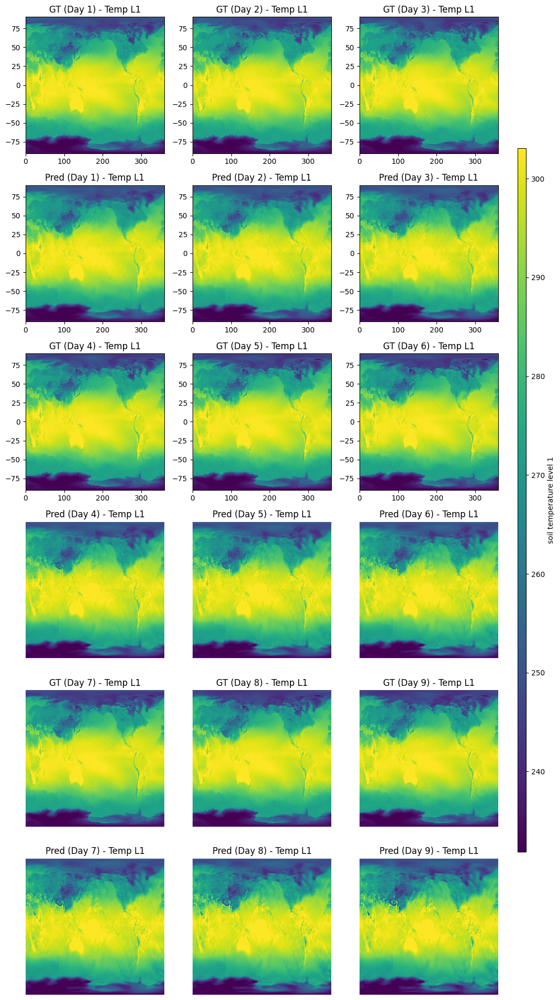

In [ ]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
from pathlib import Path
import math

# ---------------- CONFIG ----------------
LEADS = range(1, 10)  # 1..9
FILE_TMPL = "pred_{lead}.nc"
BASE_VAR = "soil_temperature_level_1"  # ground-truth var name (temperature level 1)
MAX_COLS = 3  # wrap at 3 columns

# norm must already exist like:
# norm = {'soil_temperature_level_1': {'min': ..., 'max': ...}}

# --------------- HELPERS ----------------
def denorm_pred(da, var_key=BASE_VAR):
    vmin = norm[var_key]["min"]
    vmax = norm[var_key]["max"]
    return da * (vmax - vmin) + vmin

def flipud_numpy(da):
    """np.flipud on raw values, then rebuild the DataArray."""
    flipped = np.flipud(da.values)
    return xr.DataArray(
        flipped,
        dims=da.dims,
        coords={dim: da.coords[dim] for dim in da.dims},
        attrs=da.attrs,
        name=da.name
    )

# --------------- LOAD DATA --------------
gts = []
preds = []
available_leads = []

for lead in LEADS:
    p = Path(FILE_TMPL.format(lead=lead))
    if not p.exists():
        print(f"Warning: {p} not found, skipping lead {lead}")
        continue

    ds = xr.open_dataset(p)

    # ground truth and prediction in this file
    gt_da = ds[BASE_VAR]
    pred_name = f"{BASE_VAR}_{lead}"
    if pred_name not in ds:
        cand = [v for v in ds.data_vars if v.startswith(BASE_VAR + "_")]
        if not cand:
            raise KeyError(f"No prediction variable like {BASE_VAR}_{lead} in {p}")
        pred_name = cand[-1]
    pred_da = ds[pred_name]

    # select a single slice if time/member present (do this before flipud)
    for dim in ["time", "step", "member"]:
        if dim in gt_da.dims:
            gt_da = gt_da.isel({dim: 0})
        if dim in pred_da.dims:
            pred_da = pred_da.isel({dim: 0})

    # denorm prediction; DO NOT flip ground truth; ONLY flip prediction
    pred_da = denorm_pred(pred_da)
    pred_da_flipped = flipud_numpy(pred_da)

    gts.append(gt_da)                 # unflipped GT (temperature level 1)
    preds.append(pred_da_flipped)     # flipped Pred (temperature level 1)
    available_leads.append(lead)

if not available_leads:
    raise ValueError("No pred_<lead>.nc files were found.")

# ------------- COLOR SCALE (robust, no concat) --------------
vals = np.concatenate([np.ravel(da.values) for da in (gts + preds)])
vmin = float(np.nanquantile(vals, 0.02))
vmax = float(np.nanquantile(vals, 0.98))

# --------------- PLOTTING WITH WRAP (max 3 cols) ---------------
n = len(available_leads)
cols = min(MAX_COLS, n)
blocks = math.ceil(n / cols)           # number of 2-row blocks
rows = 2 * blocks                      # GT row + Pred row per block

# size: ~3.6" per column width, ~3.2" per row height
fig_w = 3.6 * cols
fig_h = 3.2 * rows
fig, axes = plt.subplots(rows, cols, figsize=(fig_w, fig_h), squeeze=False)

im = None
for idx, (lead, gt_da, pred_da) in enumerate(zip(available_leads, gts, preds)):
    b = idx // cols                    # which block
    c = idx % cols                     # column within block
    r_gt = 2 * b                       # ground truth row index
    r_pr = 2 * b + 1                   # prediction row index

    # GT
    ax_gt = axes[r_gt, c]
    im = gt_da.plot(ax=ax_gt, vmin=vmin, vmax=vmax, add_colorbar=False)
    ax_gt.set_title(f"GT (Day {lead}) - Temp L1")
    ax_gt.set_xlabel("")
    ax_gt.set_ylabel("")

    # Pred
    ax_pr = axes[r_pr, c]
    pred_da.plot(ax=ax_pr, vmin=vmin, vmax=vmax, add_colorbar=False)
    ax_pr.set_title(f"Pred (Day {lead}) - Temp L1")
    ax_pr.set_xlabel("")
    ax_pr.set_ylabel("")

# Hide any unused axes
total_slots = rows * cols
for unused in range(n, total_slots):
    b = unused // cols
    c = unused % cols
    axes[b, c].axis("off")

# Shared colorbar
cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
plt.colorbar(im, cax=cbar_ax, label=BASE_VAR.replace("_", " "))

plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.show()


/tmp/ipython-input-2179987830.py:139: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


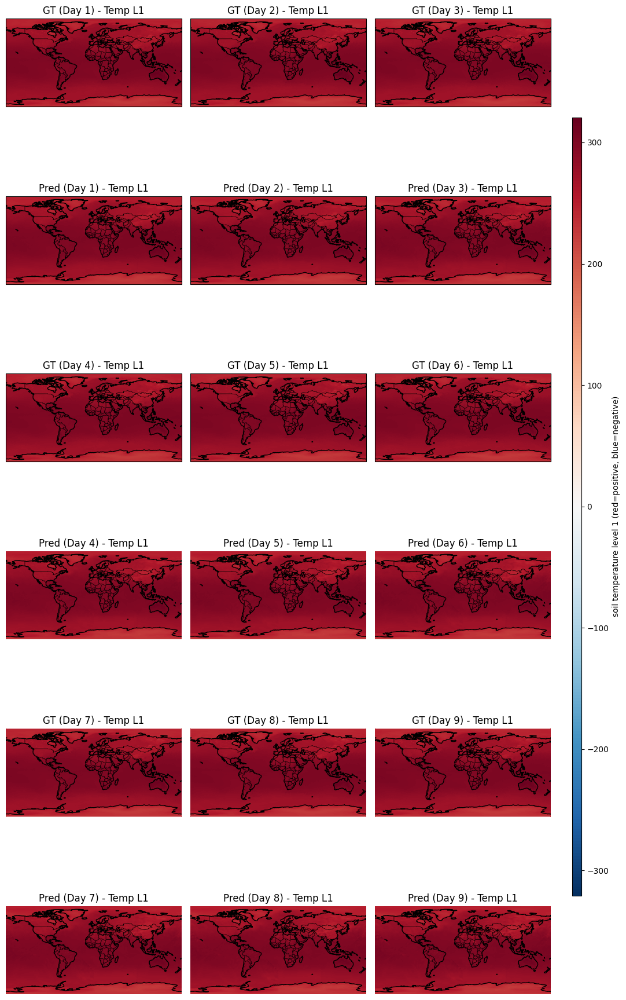

/tmp/ipython-input-1106056535.py:130: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


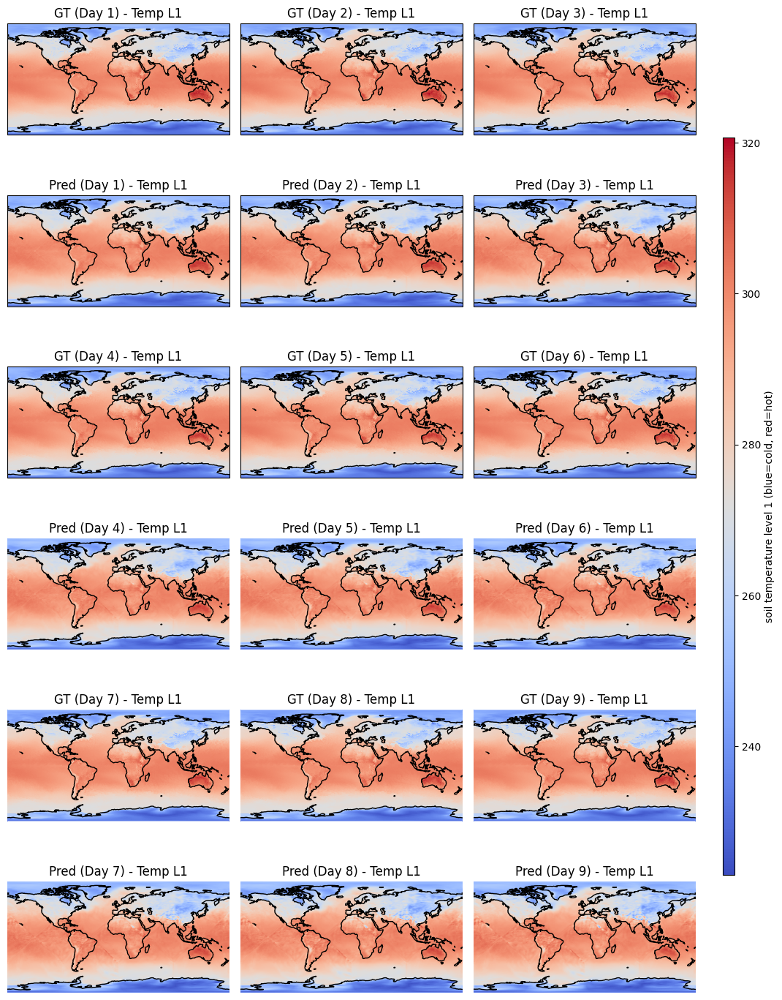

In [ ]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
from pathlib import Path
import math
import cartopy.crs as ccrs

# ---------------- CONFIG ----------------
LEADS = range(1, 10)  # 1..9
FILE_TMPL = "pred_{lead}.nc"
BASE_VAR = "soil_temperature_level_1"  # ground-truth var name
MAX_COLS = 3  # wrap at 3 columns

# norm must already exist like:
# norm = {'soil_temperature_level_1': {'min': ..., 'max': ...}}

# --------------- HELPERS ----------------
def denorm_pred(da, var_key=BASE_VAR):
    vmin = norm[var_key]["min"]
    vmax = norm[var_key]["max"]
    return da * (vmax - vmin) + vmin

def flipud_numpy(da):
    """np.flipud on raw values, then rebuild the DataArray."""
    flipped = np.flipud(da.values)
    return xr.DataArray(
        flipped,
        dims=da.dims,
        coords={dim: da.coords[dim] for dim in da.dims},
        attrs=da.attrs,
        name=da.name
    )

# --------------- LOAD DATA --------------
gts, preds, available_leads = [], [], []

for lead in LEADS:
    p = Path(FILE_TMPL.format(lead=lead))
    if not p.exists():
        print(f"Warning: {p} not found, skipping lead {lead}")
        continue

    ds = xr.open_dataset(p)

    gt_da = ds[BASE_VAR]
    pred_name = f"{BASE_VAR}_{lead}"
    if pred_name not in ds:
        cand = [v for v in ds.data_vars if v.startswith(BASE_VAR + "_")]
        if not cand:
            raise KeyError(f"No prediction variable like {BASE_VAR}_{lead} in {p}")
        pred_name = cand[-1]
    pred_da = ds[pred_name]

    # select a single slice if time/member present
    for dim in ["time", "step", "member"]:
        if dim in gt_da.dims:
            gt_da = gt_da.isel({dim: 0})
        if dim in pred_da.dims:
            pred_da = pred_da.isel({dim: 0})

    pred_da = denorm_pred(pred_da)
    pred_da_flipped = flipud_numpy(pred_da)

    gts.append(gt_da)
    preds.append(pred_da_flipped)
    available_leads.append(lead)

if not available_leads:
    raise ValueError("No pred_<lead>.nc files were found.")

# ------------- COLOR SCALE (only positive values) --------------
vals = np.concatenate([np.ravel(da.values) for da in (gts + preds)])
vmin = float(np.nanmin(vals))
vmax = float(np.nanmax(vals))

# --------------- PLOTTING WITH WRAP (max 3 cols) ---------------
n = len(available_leads)
cols = min(MAX_COLS, n)
blocks = math.ceil(n / cols)
rows = 2 * blocks  # GT row + Pred row per block

fig_w = 3.6 * cols
fig_h = 2.4 * rows   # smaller per-row height
fig, axes = plt.subplots(rows, cols,
                         figsize=(fig_w, fig_h),
                         squeeze=False,
                         subplot_kw={"projection": ccrs.PlateCarree()})

im = None
for idx, (lead, gt_da, pred_da) in enumerate(zip(available_leads, gts, preds)):
    b = idx // cols
    c = idx % cols
    r_gt, r_pr = 2 * b, 2 * b + 1

    # GT
    ax_gt = axes[r_gt, c]
    im = gt_da.plot(ax=ax_gt,
                    vmin=vmin, vmax=vmax,
                    cmap="coolwarm",   # blue = low, red = high
                    add_colorbar=False,
                    transform=ccrs.PlateCarree())
    ax_gt.coastlines()
    ax_gt.set_title(f"GT (Day {lead}) - Temp L1")
    ax_gt.set_xlabel("")
    ax_gt.set_ylabel("")

    # Pred
    ax_pr = axes[r_pr, c]
    pred_da.plot(ax=ax_pr,
                 vmin=vmin, vmax=vmax,
                 cmap="coolwarm",
                 add_colorbar=False,
                 transform=ccrs.PlateCarree())
    ax_pr.coastlines()
    ax_pr.set_title(f"Pred (Day {lead}) - Temp L1")
    ax_pr.set_xlabel("")
    ax_pr.set_ylabel("")

# Hide unused axes
total_slots = rows * cols
for unused in range(n, total_slots):
    b, c = unused // cols, unused % cols
    axes[b, c].axis("off")

# Shared colorbar
cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
plt.colorbar(im, cax=cbar_ax,
             label=f"{BASE_VAR.replace('_',' ')} (blue=cold, red=hot)")

plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.show()

/tmp/ipython-input-188400811.py:130: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 0.9, 1])


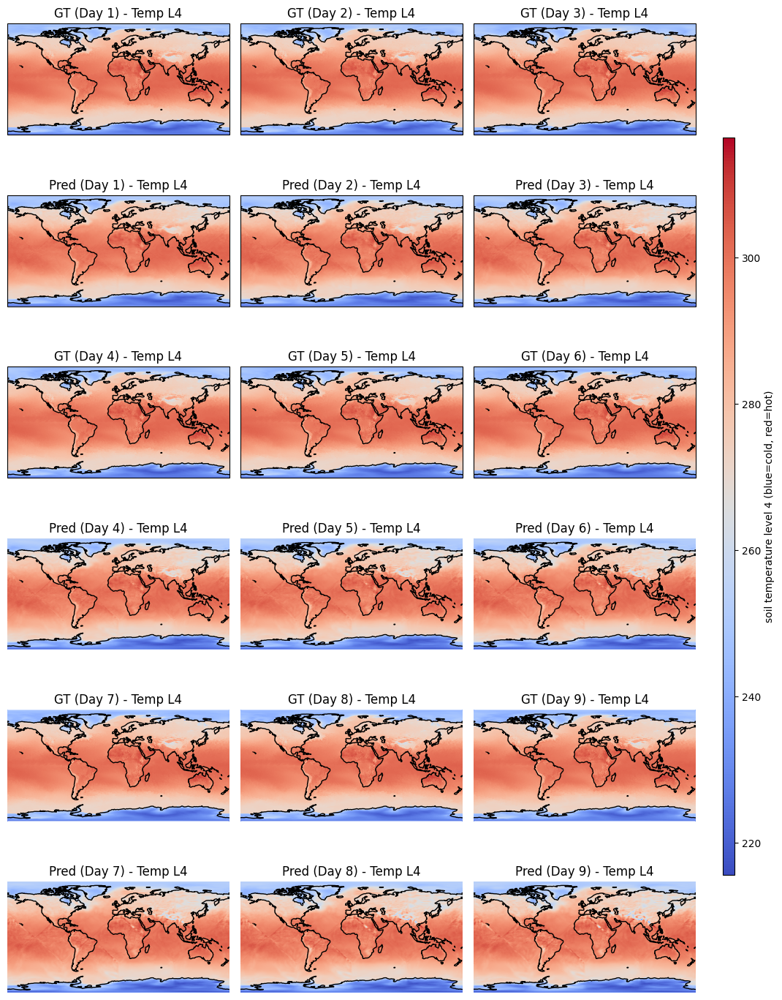

In [ ]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
from pathlib import Path
import math
import cartopy.crs as ccrs

# ---------------- CONFIG ----------------
LEADS = range(1, 10)  # 1..9
FILE_TMPL = "pred_{lead}.nc"
BASE_VAR = "soil_temperature_level_4"  # ground-truth var name
MAX_COLS = 3  # wrap at 3 columns

# norm must already exist like:
# norm = {'soil_temperature_level_4': {'min': ..., 'max': ...}}

# --------------- HELPERS ----------------
def denorm_pred(da, var_key=BASE_VAR):
    vmin = norm[var_key]["min"]
    vmax = norm[var_key]["max"]
    return da * (vmax - vmin) + vmin

def flipud_numpy(da):
    """np.flipud on raw values, then rebuild the DataArray."""
    flipped = np.flipud(da.values)
    return xr.DataArray(
        flipped,
        dims=da.dims,
        coords={dim: da.coords[dim] for dim in da.dims},
        attrs=da.attrs,
        name=da.name
    )

# --------------- LOAD DATA --------------
gts, preds, available_leads = [], [], []

for lead in LEADS:
    p = Path(FILE_TMPL.format(lead=lead))
    if not p.exists():
        print(f"Warning: {p} not found, skipping lead {lead}")
        continue

    ds = xr.open_dataset(p)

    gt_da = ds[BASE_VAR]
    pred_name = f"{BASE_VAR}_{lead}"
    if pred_name not in ds:
        cand = [v for v in ds.data_vars if v.startswith(BASE_VAR + "_")]
        if not cand:
            raise KeyError(f"No prediction variable like {BASE_VAR}_{lead} in {p}")
        pred_name = cand[-1]
    pred_da = ds[pred_name]

    # select a single slice if time/member present
    for dim in ["time", "step", "member"]:
        if dim in gt_da.dims:
            gt_da = gt_da.isel({dim: 0})
        if dim in pred_da.dims:
            pred_da = pred_da.isel({dim: 0})

    pred_da = denorm_pred(pred_da)
    pred_da_flipped = flipud_numpy(pred_da)

    gts.append(gt_da)
    preds.append(pred_da_flipped)
    available_leads.append(lead)

if not available_leads:
    raise ValueError("No pred_<lead>.nc files were found.")

# ------------- COLOR SCALE (only positive values) --------------
vals = np.concatenate([np.ravel(da.values) for da in (gts + preds)])
vmin = float(np.nanmin(vals))
vmax = float(np.nanmax(vals))

# --------------- PLOTTING WITH WRAP (max 3 cols) ---------------
n = len(available_leads)
cols = min(MAX_COLS, n)
blocks = math.ceil(n / cols)
rows = 2 * blocks  # GT row + Pred row per block

fig_w = 3.6 * cols
fig_h = 2.4 * rows   # smaller per-row height
fig, axes = plt.subplots(rows, cols,
                         figsize=(fig_w, fig_h),
                         squeeze=False,
                         subplot_kw={"projection": ccrs.PlateCarree()})

im = None
for idx, (lead, gt_da, pred_da) in enumerate(zip(available_leads, gts, preds)):
    b = idx // cols
    c = idx % cols
    r_gt, r_pr = 2 * b, 2 * b + 1

    # GT
    ax_gt = axes[r_gt, c]
    im = gt_da.plot(ax=ax_gt,
                    vmin=vmin, vmax=vmax,
                    cmap="coolwarm",   # blue = low, red = high
                    add_colorbar=False,
                    transform=ccrs.PlateCarree())
    ax_gt.coastlines()
    ax_gt.set_title(f"GT (Day {lead}) - Temp L4")
    ax_gt.set_xlabel("")
    ax_gt.set_ylabel("")

    # Pred
    ax_pr = axes[r_pr, c]
    pred_da.plot(ax=ax_pr,
                 vmin=vmin, vmax=vmax,
                 cmap="coolwarm",
                 add_colorbar=False,
                 transform=ccrs.PlateCarree())
    ax_pr.coastlines()
    ax_pr.set_title(f"Pred (Day {lead}) - Temp L4")
    ax_pr.set_xlabel("")
    ax_pr.set_ylabel("")

# Hide unused axes
total_slots = rows * cols
for unused in range(n, total_slots):
    b, c = unused // cols, unused % cols
    axes[b, c].axis("off")

# Shared colorbar
cbar_ax = fig.add_axes([0.92, 0.15, 0.015, 0.7])
plt.colorbar(im, cax=cbar_ax,
             label=f"{BASE_VAR.replace('_',' ')} (blue=cold, red=hot)")

plt.tight_layout(rect=[0, 0, 0.9, 1])
plt.show()